In [1]:
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
from ipywidgets import interactive
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
from ipywidgets import interactive
from scipy.fftpack import fft, ifft,ifftshift,fftshift
from IPython.display import display, HTML
from scipy.linalg import circulant
from scipy.linalg import toeplitz, hankel
from IPython.display import clear_output
from scipy.linalg import expm
import pickle
from matplotlib import colors


#### --------- Definition of variables ------------------------

N_size=50001 #
Gamma=0.5
Lambda=0.5
num_data=2000
#### ------------------------------------------------------------
def Fermi_dirac(beta,mu,n,Gamma=Gamma,Lambda=Lambda,N=N_size):
    # beta is the inverse thermic energy associated in the system (beta)
    # mu corresponds to the chemical potential
    # n is the position of the particle
    # f=np.exp(T*(Omega(Gamma,Lambda,2.0*(np.pi/N)*n)-mu)) +1
    # N corresponds to the size of the system
    f=np.exp(beta*(Omega(Gamma,Lambda,((2.*np.pi)/float(N)) * n)-mu)) +1
    return 1/f


display(HTML("""
<style>
.output {
    display: flex;
    align-items: left;
    text-align: center;
}
</style>
"""))

def Alpha(Gamma,Lambda,theta):
    return Lambda+np.cos(theta)
def Beta(Gamma,Lambda,theta):
    return Gamma*np.sin(theta)
def Omega(Gamma,Lambda,theta):
    return np.sqrt(Alpha(Gamma,Lambda,theta)**2 + Beta(Gamma,Lambda,theta)**2 )
def Phi(Gamma,Lambda,theta):
    return np.arctan2(Beta(Gamma,Lambda,theta),Alpha(Gamma,Lambda,theta))


def Get_Bands_Matrix(N_size,Gamma=Gamma,Lambda=Lambda,beta=0.40824,mu=0,Ground =False):
    if Ground:
        x=np.arange(0,(N_size-1)/2+ 1)
        m_cos=[-0.5 for i in x]
        m_sin=[-0.5 for i in x]
        x=np.arange(-(N_size-1)/2,(N_size-1)/2+1)
        M_minous=[((m_cos[np.abs(int(i))]-m_sin[np.abs(int(i))])*0.5*np.exp(1.j*np.sign((2.0*np.pi/N_size) * i)*Phi(Gamma,Lambda,np.abs((2.0*np.pi/N_size) * i)))) for i in x]
        M_plus = [((m_cos[np.abs(int(i))]+m_sin[np.abs(int(i))])*0.5*np.exp(1.j*np.sign((2.0*np.pi/N_size) * i)*Phi(Gamma,Lambda,np.abs((2.0*np.pi/N_size) * i)))) for i in x]
        Mminousband=np.array(M_minous)
        Mplusband=np.array(M_plus)
        
    else:
        x=np.arange(0,(N_size-1)/2+ 1)
        m_cos=[-0.5 if np.random.random()>Fermi_dirac(beta,mu,n=i) else 0.5 for i in x]
        m_sin=[-0.5 if np.random.random()>Fermi_dirac(beta,mu,n=i) else 0.5 for i in x]
        x=np.arange(-(N_size-1)/2,(N_size-1)/2+1)

        M_minous=[((m_cos[np.abs(int(i))]-m_sin[np.abs(int(i))])*0.5*np.exp(1.j*np.sign((2.0*np.pi/N_size) * i)*Phi(Gamma,Lambda,np.abs((2.0*np.pi/N_size) * i)))) for i in x]
        M_plus = [((m_cos[np.abs(int(i))]+m_sin[np.abs(int(i))])*0.5*np.exp(1.j*np.sign((2.0*np.pi/N_size) * i)*Phi(Gamma,Lambda,np.abs((2.0*np.pi/N_size) * i)))) for i in x]
        Mminousband=np.array(M_minous)
        Mplusband=np.array(M_plus)
        
    x=np.arange(-(N_size-1)/2,(N_size-1)/2+ 1)
    Fourier_plus=fft(ifftshift(Mplusband))
    Fourier_minous=fft(ifftshift(Mminousband))
    return Fourier_plus/N_size,Fourier_minous/N_size

def Toeplitz_matrix(Fourier_plus,L):
    First_column = Fourier_plus[:L]
    First_row = np.roll(Fourier_plus,-1)[::-1][:L]
    return toeplitz(First_column,First_row)
def Hankel_matrix(Fourier_minous,L):
    to_use=Fourier_minous[:2*L-1]
    First_column=to_use[:L]
    Last_row=np.roll(to_use,-L+1)[:L]
    return hankel(First_column,Last_row)

def Covariance_matrix(L,Gamma=Gamma,Lambda=Lambda,beta=0.40824,mu=0,N_size=N_size,Ground=False):
    if Ground:
        Fourier_plus,Fourier_minous=Get_Bands_Matrix(Gamma=Gamma,Lambda=Lambda,N_size=N_size,beta=beta,mu=mu,Ground=True)
    else:
        Fourier_plus,Fourier_minous=Get_Bands_Matrix(Gamma=Gamma,Lambda=Lambda,N_size=N_size,beta=beta,mu=mu,Ground=False)
    return (Toeplitz_matrix(Fourier_plus,L)+Hankel_matrix(Fourier_minous,L))

def Covariance_matrix_from_sub_sample(Fourier_plus,Fourier_minous,L):
    return (Toeplitz_matrix(Fourier_plus,L)+Hankel_matrix(Fourier_minous,L))


def print_progress(total,step,num=50):
    message="["+"="*int(num*((step/total)))+" "*int(num*(1-(step/total)))+"]"
    message+="  "+str(round(step/total*100,3))+ " "+ "%"
    print(message,end="\r")
    
def get_band_of_matrix(Matrix,num_band):
    L,C=Matrix.shape
    if L!=C:
        raise ValueError("Only squared matrix can be computed")
    if num_band > 0:
        return np.array([[Matrix[i,j] for i in range(num_band,L) if i-j == num_band] for j in range(L-num_band)]).reshape(L-num_band)
    elif num_band <0:
        return np.array([[Matrix[i,j] for i in range(L) if i-j == num_band] for j in range(-num_band,L)]).reshape(L+num_band)
    else:
        return np.diagonal(Matrix)

In [2]:
with open('data_50k.pkl', 'rb') as File:
    Data=pickle.load(File)

In [3]:
F_plus,F_minous=Data[:,:,0],Data[:,:,1]
F_plus_avg,F_minous_avg=Data[:,:,0].mean(axis=0),Data[:,:,1].mean(axis=0)

In [4]:
L=81
Cov_matrix=Covariance_matrix_from_sub_sample(F_plus_avg,F_minous_avg,L)
O_1,S,O_2=np.linalg.svd(Cov_matrix)

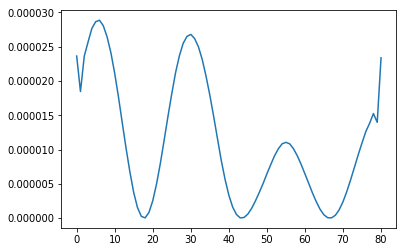

In [5]:
plt.plot((O_1[:,0]+O_2[0,:])**2)

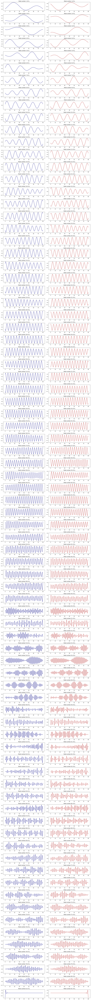

In [6]:
k=1
plt.figure(figsize=(15,int(2*L)))
for i in range(L):
    plt.subplot(L,2,k)
    k+=1
    plt.title(r"Mode number {} of $O_1$".format(i+1))
    plt.plot(O_1[:,i],color="navy")
    plt.subplot(L,2,k)
    plt.title(r"Mode number {} of $O_2$".format(i+1))
    plt.plot(O_2[i,:],color="firebrick")
    k+=1
plt.tight_layout()
plt.show()

Define a a participation function given by 
$$
P=\left(O_1+O_2\right)^2/4
$$

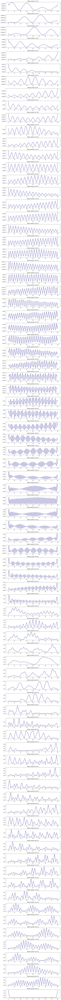

In [7]:
k=1
plt.figure(figsize=(10,int(2*L)))
for i in range(L):
    plt.subplot(L,1,k)
    k+=1
    plt.title(r"Mode number {} of $O_1$".format(i+1))
    plt.plot((O_1[:,i]+O_2[i,:])**2/4,color="navy")
plt.tight_layout()
plt.show()

Something similar to a participation function given by 
$$
P=\left(O_1^2+O_2^2\right)/2
$$

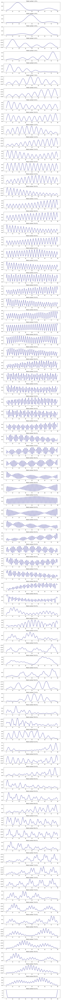

In [8]:
k=1
plt.figure(figsize=(10,int(2*L)))
for i in range(L):
    plt.subplot(L,1,k)
    k+=1
    plt.title(r"Mode number {} of $O_1$".format(i+1))
    plt.plot((O_1[:,i]**2+O_2[i,:]**2),color="navy")
plt.tight_layout()
plt.show()

# Using averages

In [9]:
L=81
Cov_matrix=Covariance_matrix_from_sub_sample(F_plus_avg,F_minous_avg,L)
O_1,S,O_2=np.linalg.svd(Cov_matrix)
M_corner=np.zeros((L,L))
M_corner[0,L-1],M_corner[L-1,0]=Cov_matrix[1,0],Cov_matrix[0,1]
O_1_c,S_c,O_2_c = np.linalg.svd(Cov_matrix+M_corner)

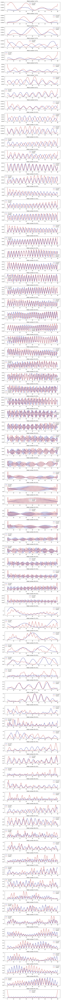

In [10]:
k=1
plt.figure(figsize=(10,int(2*L)))
for i in range(L):
    plt.subplot(L,1,k)
    k+=1
    plt.title(r"Mode number {} of $O_1$".format(i+1))
    plt.plot((O_1_c[:,i]+O_2_c[i,:])**2,color="navy",label="Circulant")
    plt.plot((O_1[:,i]+O_2[i,:])**2,color="firebrick",label="Toeplitz")
    plt.legend()
plt.tight_layout()
plt.show()

In [11]:
L=81
Cov_matrix=Covariance_matrix_from_sub_sample(F_plus[0,:],F_minous[0,:],L)
O_1,S,O_2=np.linalg.svd(Cov_matrix)
M_corner=np.zeros((L,L))
M_corner[0,L-1],M_corner[L-1,0]=Cov_matrix[1,0],Cov_matrix[0,1]
O_1_c,S_c,O_2_c = np.linalg.svd(Cov_matrix+M_corner)

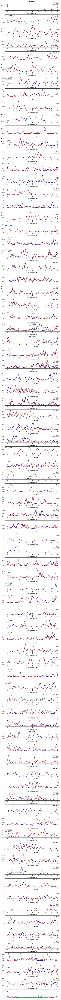

In [12]:
k=1
plt.figure(figsize=(10,int(2*L)))
for i in range(L):
    plt.subplot(L,1,k)
    k+=1
    plt.title(r"Mode number {} of $O_1$".format(i+1))
    plt.plot((O_1_c[:,i]+O_2_c[i,:])**2,color="navy",label="Circulant")
    plt.plot((O_1[:,i]+O_2[i,:])**2,color="firebrick",label="Toeplitz")
    plt.legend()
plt.tight_layout()
plt.show()

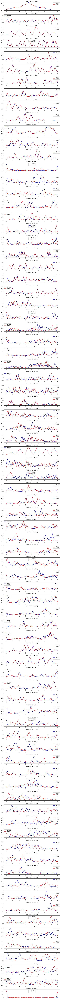

In [16]:
k=1
L=81
plt.figure(figsize=(10,int(2*L)))
for i in range(L):
    plt.subplot(L,1,k)
    k+=1
    plt.title(r"Mode number {} of $O_1$".format(i+1))
    plt.plot((O_1_c[:,i]**2+O_2_c[i,:]**2),color="navy",label="Circulant")
    plt.plot((O_1[:,i]**2+O_2[i,:]**2),color="firebrick",label="Toeplitz")
    plt.legend()
plt.tight_layout()
plt.show()

Looking at the noise

In [106]:
results_circ=[]
results_toep=[]
range_size=range(3,2701,2)
for L in range_size:
    M=Covariance_matrix_from_sub_sample(F_plus_avg,F_minous_avg,L=L)
    M_corner=np.zeros((L,L))
    M_corner[0,L-1],M_corner[L-1,0]=M[1,0].real, M[0,1].real
    S_circulant=np.linalg.svd(M+M_corner,compute_uv=False)
    S_toeplitz=np.linalg.svd(M,compute_uv=False)
    n=np.arange(-(L-1)/2,(L-1)/2 +1)
    f=Fermi_dirac(beta=0.40824,mu=0,n=n,Gamma=Gamma,Lambda=Lambda,N=L)
    tmp_circ=np.square(np.array(sorted(f,reverse=True))-np.array(sorted(-S_circulant+0.5,reverse=True)))
    tmp_toep=np.square(np.array(sorted(f,reverse=True))-np.array(sorted(-S_toeplitz+0.5,reverse=True)))
    results_circ.append(np.sum(tmp_circ))
    results_toep.append(np.sum(tmp_toep))
    print(results_circ[-1],results_toep[-1],L)

1.162510300923437e-06 0.0024774291955120546 3
7.959781311374877e-07 0.0026889564066623233 5
5.020697667696377e-07 0.0027709925252311822 7
5.371764965209519e-07 0.0024752591087463093 9
5.048866267142478e-07 0.002219834169888155 11
5.476171772884768e-07 0.002205434226831244 13
5.754742795924856e-07 0.0022340864977290066 15
7.95749714907097e-07 0.002073504447284046 17
8.737581948355844e-07 0.001999538581773136 19
9.12158815490744e-07 0.002013401469721837 21
1.0963099342115804e-06 0.002033116438882702 23
1.1937800569293042e-06 0.0019468325054806238 25
1.299319838208796e-06 0.0019420377363971273 27
1.3838307245488283e-06 0.0019402496777248337 29
1.6407301717098313e-06 0.0019212964802134869 31
1.7681399863242356e-06 0.0018917464353083641 33
1.667131937046318e-06 0.0018819736231364106 35
1.9987317649776264e-06 0.0019051854501458065 37
2.1045632228944913e-06 0.0018691786864054088 39
2.598577413475119e-06 0.0018656352422410974 41
2.851486766594193e-06 0.0018496698885054439 43
3.3583298638113853

5.978733304050647e-05 0.0017825410562112027 351
5.987663871898339e-05 0.0017815766926267964 353
5.971070046308897e-05 0.0017781346063479799 355
5.970324665920799e-05 0.0017806972691215637 357
6.029183124321609e-05 0.0017836338480861148 359
5.9413323784054955e-05 0.001784105009886691 361
6.314398868643965e-05 0.0017849446016087228 363
5.973881470991759e-05 0.0017848361547374765 365
6.159310021664347e-05 0.0017828681920777087 367
5.916585194080175e-05 0.0017826730339142345 369
6.141160270567965e-05 0.001782386768773882 371
6.062882498875315e-05 0.0017871326432108952 373
6.187952805497428e-05 0.001779552626642758 375
6.197615686768113e-05 0.001787122077358549 377
6.17507710358158e-05 0.0017866400318840203 379
6.399593852110018e-05 0.0017883086849188488 381
6.208092598956824e-05 0.0017914830329751228 383
6.162029870342454e-05 0.0017834013984488317 385
6.281448968694031e-05 0.0017806428868660292 387
6.32970935509666e-05 0.001790732336085429 389
6.184663709947393e-05 0.001777526682373556 391

0.00012655081754040447 0.0018539691875437594 695
0.0001283309798445503 0.0018542868675879137 697
0.0001277704877506762 0.0018477823687628478 699
0.00012907980359765046 0.0018526677994057216 701
0.00013108669419167995 0.001848651097175023 703
0.0001284282804684686 0.0018525423680085325 705
0.00013240222298376887 0.0018535279102367245 707
0.00013130760490272307 0.0018512481585860544 709
0.00013066446330959556 0.0018536947802766665 711
0.0001333277407540798 0.0018473878183552146 713
0.00013247526920036914 0.0018520734880947743 715
0.00013491739454027802 0.0018476748832792253 717
0.00013469609439150466 0.001856419621366896 719
0.00013477990132719798 0.0018515903700247961 721
0.00013668076629049967 0.0018598818989200166 723
0.00013636002109993503 0.001851151120710649 725
0.0001363587132893313 0.0018591344279554416 727
0.00013808707797669537 0.0018599471226918875 729
0.0001374940823102996 0.0018539268539864856 731
0.00013750269354717681 0.0018620996825340075 733
0.0001406020247330866 0.00185

0.0002442438075456739 0.0019655031863898063 1033
0.0002457908207721941 0.0019656319826337693 1035
0.00024446009776437087 0.0019688024331853027 1037
0.0002480863133590101 0.001964911562445537 1039
0.0002472231499924862 0.00196954617895317 1041
0.00024840779357977223 0.0019709810770216748 1043
0.00024905311798629803 0.0019637929920358773 1045
0.00025050234896134967 0.001972485293230209 1047
0.0002516311462529194 0.001975289039753066 1049
0.00025212146139540106 0.0019655393763635806 1051
0.0002525674505432245 0.001974317790790452 1053
0.00025511205150308917 0.0019764291056716793 1055
0.0002538760739955483 0.0019679416917287953 1057
0.0002558904822808521 0.0019733698402818723 1059
0.00025609464103183883 0.0019804718879676067 1061
0.0002576325150198585 0.0019765355678752275 1063
0.00025892357346085073 0.0019778181548332796 1065
0.00025850547042289467 0.001980729585670455 1067
0.0002612399447480424 0.001983642302693874 1069
0.00026156976766780683 0.0019832750017667166 1071
0.0002615371413439

0.00042316158548476584 0.002140218256345593 1369
0.000423882996442277 0.0021481913054725737 1371
0.000425968568597093 0.0021400474041308555 1373
0.00042667701015815175 0.0021484442888548413 1375
0.00042897599080911656 0.0021503897762010053 1377
0.0004295489202123762 0.0021531712661156705 1379
0.0004310361186517946 0.00215234144563918 1381
0.0004316706715490488 0.002157226370157465 1383
0.0004339934187359612 0.0021516055751915333 1385
0.00043411948929718416 0.0021590710532195497 1387
0.00043482599929354604 0.0021534793881513815 1389
0.0004369102589661617 0.0021570680679939016 1391
0.00043729719765047597 0.002157346443239661 1393
0.0004391099485454403 0.002159308337631088 1395
0.00044040459282365684 0.0021600588662099725 1397
0.0004407023407861122 0.0021593688423895427 1399
0.0004429864781379527 0.002168339831865056 1401
0.00044375165307118214 0.002166919244430696 1403
0.00044462348543709433 0.0021642367804026704 1405
0.0004472345149665715 0.0021694078040015267 1407
0.0004470207761930401

0.0006720471326836207 0.002395304067343724 1707
0.0006734787285176346 0.0023982051359050303 1709
0.0006752118241024668 0.002397570793518139 1711
0.0006766099301610624 0.0023934835770560757 1713
0.000679328870927708 0.0023992255063441732 1715
0.000680464623718059 0.0024039462249630513 1717
0.0006832407695615736 0.002406700801946691 1719
0.0006837749201224342 0.002403510548646733 1721
0.0006858765205342066 0.002410155288910205 1723
0.0006878831990408277 0.0024072350284252936 1725
0.0006889379061683573 0.0024108179083489915 1727
0.000690754164250436 0.002414825665105183 1729
0.0006922394728231475 0.0024165831780647213 1731
0.0006939772986579296 0.0024118703784308817 1733
0.0006959284232223407 0.0024157679164415005 1735
0.0006975183162918231 0.002421307159165667 1737
0.0006991645982756885 0.002424168431385245 1739
0.0007003389332127554 0.0024251030557688583 1741
0.0007027984108744941 0.0024263350066433343 1743
0.0007039452867002962 0.002426801452074695 1745
0.0007064837156237737 0.00242741

0.0010015083636213 0.002719658264999018 2047
0.0010034733745963482 0.0027184493085822313 2049
0.0010067248564485849 0.002727581802345577 2051
0.0010075545508066272 0.0027272849427625264 2053
0.001011250627099918 0.0027316946336934634 2055
0.0010123903389357709 0.0027351436312571197 2057
0.0010156478766166414 0.0027284145701409303 2059
0.0010176611285815324 0.0027413061324530513 2061
0.001019206645002357 0.00273721689985283 2063
0.0010219718350032501 0.002744070796257744 2065
0.0010225898761025598 0.00274265881447257 2067
0.0010261081649507971 0.0027496471243773192 2069
0.0010272586439577013 0.0027505373206667193 2071
0.0010297388654400268 0.0027501794994669038 2073
0.001032492057426575 0.0027498729830926997 2075
0.0010333888705190315 0.0027552707024092148 2077
0.0010363780099181465 0.0027571574950710004 2079
0.0010377884557443275 0.002761331111431726 2081
0.00103993156457486 0.0027607951280920733 2083
0.0010421748007572687 0.0027603083675563408 2085
0.001043322029750582 0.0027668988831

0.001399128929573096 0.0031193727067433995 2387
0.001400282920951508 0.0031240762060071956 2389
0.001403258437521068 0.0031224961657420865 2391
0.0014066751704610776 0.00313048098562278 2393
0.0014076349438263884 0.003131633473997609 2395
0.001411750293282001 0.0031316631580775175 2397
0.001412969714176228 0.0031373666035023305 2399
0.0014171774230620797 0.00314033745596379 2401
0.0014191858810225634 0.0031359950447974057 2403
0.0014218258839569897 0.0031459985468572024 2405
0.0014248951651933905 0.003146472401207293 2407
0.0014264212841349566 0.003146199795495627 2409
0.001430355689891429 0.0031529563878213165 2411
0.0014322456053748878 0.003156644849786841 2413
0.0014357692589333619 0.0031588740759228963 2415
0.001438297757448271 0.0031572248842548097 2417
0.0014410604743672504 0.003151768810466143 2419
0.0014439998449980254 0.0031636916885350113 2421
0.0014469357808872562 0.003167919565072562 2423
0.0014495443885657146 0.003173476640350804 2425
0.0014520174792936097 0.00317458812368

In [107]:
cosa=np.genfromtxt("../data.txt")
results_circ=cosa[:,0]
results_toep=cosa[:,1]
range_size=cosa[:,2]

In [108]:
results_circ=pd.Series(results_circ,index=range_size)
results_toep=pd.Series(results_toep,index=range_size)

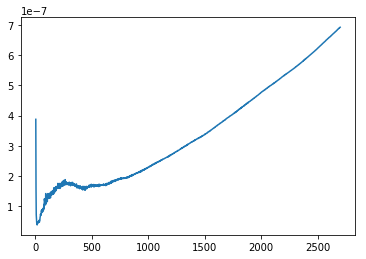

In [112]:
(results_circ/results_circ.index).plot()

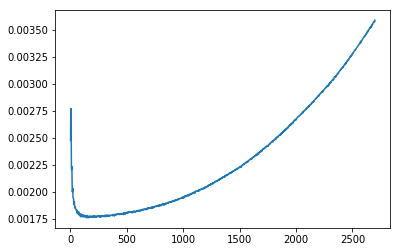

In [111]:
(results_toep).plot()

(-0.002, 0.002)

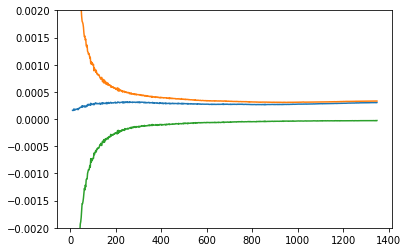

In [36]:
plt.plot(range(11,1351,2),results_circ)
plt.plot(range(11,1351,2),results_toep)
plt.plot(range(11,1351,2),-np.array(results_toep)+np.array(results_circ))
plt.ylim(-0.002,0.002)

In [27]:
from scipy.optimize import curve_fit

In [70]:
from mpl_toolkits.mplot3d import Axes3D

from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

In [80]:
L=21
Matrix_fluctuation=Covariance_matrix_from_sub_sample(F_plus_avg,F_minous_avg,L=L)-Covariance_matrix_from_sub_sample(F_plus[0,:],F_minous[0,:],L=L)

x,y=np.arange(L),np.arange(L)
X,Y=np.meshgrid(x,y)
Z=Matrix_fluctuation

In [81]:
%matplotlib notebook

<IPython.core.display.Javascript object>


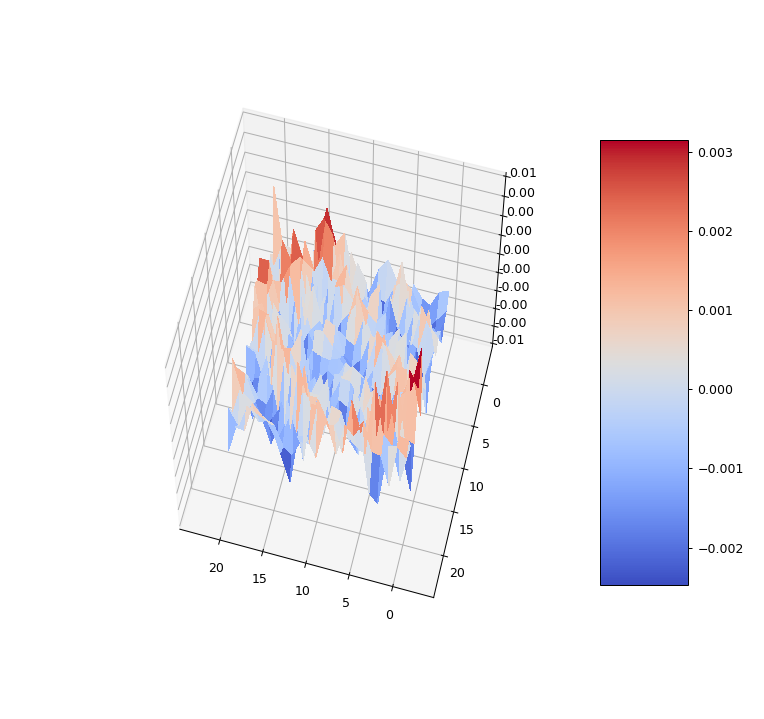

In [83]:
fig = plt.figure(figsize=(8,8))
ax = fig.gca(projection='3d')
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))

# Add a color bar which maps values to colors.
fig.colorbar(surf, aspect=5)
ax.view_init(elev=30., azim=45)

plt.show()